In [2]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm
import GraphHelpers as GH

In [3]:
#Read in data
RawData=pd.read_csv('.\RawDatafiles\RainShelterBeta_Energy.dat.gz', #specify file path for data to read in
                         compression = 'gzip',  #file is ziped
                         parse_dates=True, #tell the function to parse date columns to datetime formats
                         dayfirst=True, #tell the function that the day is before the year in the data i.e format='%d/%m/%Y %H:%M'
                         skiprows = [0,2,3], #leave out rows 1, 3 and 4 which have redundant information
                         index_col = 0, #Use the first column, which is Date, as an index
                         na_values = 'NAN')

## Check index for duplicates

In [4]:
seen = {}
dupes = []

for x in RawData.index:
    if x not in seen:
        seen[x] = 1
    else:
        if seen[x] == 1:
            dupes.append(x)
        seen[x] += 1
dupes

[Timestamp('2015-11-12 10:10:00'),
 Timestamp('2015-11-12 10:20:00'),
 Timestamp('2015-11-12 10:30:00'),
 Timestamp('2015-11-12 10:40:00'),
 Timestamp('2015-11-12 10:50:00'),
 Timestamp('2015-11-12 11:00:00'),
 Timestamp('2015-11-12 11:10:00'),
 Timestamp('2015-11-12 11:20:00'),
 Timestamp('2015-11-12 11:30:00'),
 Timestamp('2015-11-12 11:40:00'),
 Timestamp('2015-11-12 11:50:00'),
 Timestamp('2015-11-12 12:00:00'),
 Timestamp('2015-11-12 12:10:00'),
 Timestamp('2015-11-12 12:20:00'),
 Timestamp('2015-11-12 12:30:00'),
 Timestamp('2015-11-12 12:40:00'),
 Timestamp('2015-11-12 12:50:00'),
 Timestamp('2015-11-12 13:00:00'),
 Timestamp('2015-11-12 13:10:00'),
 Timestamp('2015-11-12 13:20:00'),
 Timestamp('2015-11-12 13:30:00'),
 Timestamp('2015-11-12 13:40:00'),
 Timestamp('2015-11-12 13:50:00'),
 Timestamp('2015-11-12 14:00:00'),
 Timestamp('2015-11-12 14:10:00'),
 Timestamp('2015-11-12 14:20:00'),
 Timestamp('2015-11-12 14:30:00'),
 Timestamp('2015-11-12 14:40:00'),
 Timestamp('2015-11-

In [5]:
RawData.loc[dupes,:]

,RECORD,BattV_Avg,PTemp_C_Avg,AirTC_Avg,RH_Max,SlrkW_Avg,SlrMJ_Tot,Rain_mm_Tot,WS_ms_Avg,LeafWet_kohms_Avg,...,LinPAR_Avg(18),LinPAR_Avg(19),LinPAR_Avg(20),LinPAR_Avg(21),LinPAR_Avg(22),LinPAR_Avg(23),LinPAR_Avg(24),LinPAR_Avg(25),LinPAR_Avg(26),LinPAR_Avg(27)
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2015-11-12 10:10:00,0,13.93,11.30,8.670,81.50,0.0,0.000485,0,4.512,NaN,...,160.10,142.00,147.70,127.40,148.8,124.00,164.60,335.9,311.1,347.2
2015-11-12 10:10:00,0,13.93,11.30,8.670,81.50,0.0,0.000485,0,4.512,NaN,...,160.10,142.00,147.70,127.40,148.8,124.00,164.60,335.9,311.1,347.2
2015-11-12 10:20:00,1,13.65,11.56,9.740,78.19,0.0,0.000971,0,6.852,305.20,...,344.90,273.90,337.00,302.10,341.5,281.80,349.40,728.1,634.6,777.7
2015-11-12 10:20:00,1,13.65,11.56,9.740,78.19,0.0,0.000971,0,6.852,305.20,...,344.90,273.90,337.00,302.10,341.5,281.80,349.40,728.1,634.6,777.7
2015-11-12 10:30:00,2,13.94,12.30,10.470,78.26,0.0,0.000485,0,6.942,5015.00,...,287.40,239.00,266.00,255.90,284.0,243.50,313.30,604.1,528.6,619.9
2015-11-12 10:30:00,2,13.94,12.30,10.470,78.26,0.0,0.000485,0,6.942,5015.00,...,287.40,239.00,266.00,255.90,284.0,243.50,313.30,604.1,528.6,619.9
2015-11-12 10:40:00,3,13.96,13.05,10.610,74.73,0.0,0.000607,0,6.766,7999.00,...,651.50,595.10,543.30,467.80,520.7,449.70,690.90,1151.0,1093.0,1152.0
2015-11-12 10:40:00,3,13.96,13.05,10.610,74.73,0.0,0.000607,0,6.766,7999.00,...,651.50,595.10,543.30,467.80,520.7,449.70,690.90,1151.0,1093.0,1152.0
2015-11-12 10:50:00,4,13.83,13.78,11.020,74.26,0.0,0.000607,0,6.918,7999.00,...,631.20,569.20,517.30,432.80,467.7,408.00,630.00,1089.0,1034.0,1089.0


## It seems all of these duplicate indexes have duplicated data

In [6]:
RawData.drop_duplicates(inplace=True)

## Check again for duplicates

In [7]:
seen = {}
dupes = []

for x in RawData.index:
    if x not in seen:
        seen[x] = 1
    else:
        if seen[x] == 1:
            dupes.append(x)
        seen[x] += 1
dupes

[]

In [8]:
#Bring in index data
DataIndex=pd.read_excel('.\IndexFiles\RadiationAndTempIndex.xlsx', 
                        sheet_name='Sensor positions',
                        usecols = range(9))
DataIndex.set_index('ColumnHeader',inplace=True)
# #Apply indexes to data
DataTransposed = RawData.transpose() 
DataIndexed = pd.concat([DataIndex,DataTransposed], axis=1,sort=False)
DataIndexed.index.name='ColumnHeader'
DataIndexed.set_index(['Measurement','Irrigation','Nitrogen','Treatment','Units','Summary','Plot','Block'], 
                         append=False, inplace=True)
Data=DataIndexed.transpose()
Data.index = pd.to_datetime(Data.index)  ## for some reason the concat function changes the data type on the date indes so need to change it back
Data = Data.drop(columns='Time',level=0) ## Drop blank time column
Data.sort_index(inplace=True)
Data.sort_index(axis=1,inplace=True)

## Set up Graphics Patterns

In [9]:
GPs = GH.SetGraphicsPatterns(Data.IR_SurfaceTemp.columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['orange','green','purple'])

Start = Data.index.min()
End = Data.index.max()

Irrigation
['Dryland', 'Irrigated']
Nitrogen
['0', '250', '50']
Treatments
MultiIndex(levels=[['Dryland', 'Irrigated'], ['0', '250', '50']],
           labels=[[0, 0, 0, 1, 1, 1], [0, 1, 2, 0, 1, 2]])
Styles
[('-', 'orange', 0.15, 'o'), ('-', 'green', 0.15, 'o'), ('-', 'purple', 0.15, 'o'), ('--', 'orange', 0.45, '^'), ('--', 'green', 0.45, '^'), ('--', 'purple', 0.45, '^')]
StyleFrame
              Lin     Col   Alp Mar     MFC
Dryland   0     -  orange  0.15   o  orange
          250   -   green  0.15   o   green
          50    -  purple  0.15   o  purple
Irrigated 0    --  orange  0.45   ^   white
          250  --   green  0.45   ^   white
          50   --  purple  0.45   ^   white


### Work out how long our date series in in weeks

In [10]:
from datetime import timedelta #Import function needed for doing date deltas 
FirstMeasurement  = Data.index.min(axis=0)
LastMeasurement = Data.index.max(axis=0)
Duration = (LastMeasurement - FirstMeasurement)/timedelta(weeks=1)
ExptDuration = np.round(Duration,decimals=0) #weeks
ExptDuration

18.0

### Graph data in two weekly blocks to see how it looks

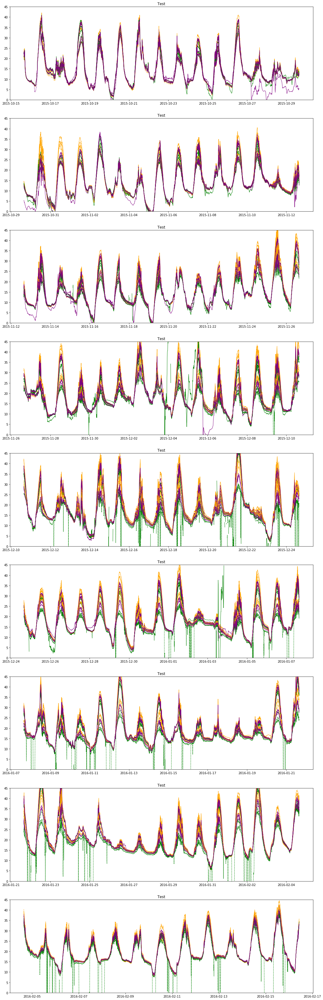

In [11]:
def MakeGraph(DataFrame,ymax,ymin):
    PlotDuration = 2
    Pannels = np.int(ExptDuration/PlotDuration)
    #Create a figure object
    for X in range (0,Pannels):
        if (X == 0):
            StartDate = Data.index.min(axis=0)  #Set start of series at start of data
        else: 
            StartDate = StartDate + timedelta(weeks=PlotDuration)    #increment start date by a week
        StartDateString = StartDate.strftime("%Y-%m-%d")  #Turn this to a string
        EndDate = StartDate + timedelta(weeks=PlotDuration)       #Set start date the specified duration before the end date 
        EndDateString = EndDate.strftime("%Y-%m-%d")           #Turn that into a string
        Position = X+1;
        ax = Fig.add_subplot(Pannels,1,Position)
        GH.AddIndexedPlot(DataFrame.loc[StartDate:EndDate,:],ax,GPs,1)
        plt.title('Test', fontsize=12);
        plt.ylim(ymin,ymax)
        
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

### Some of the sensors have problems.  Check the sensor body temperature reference to work out why

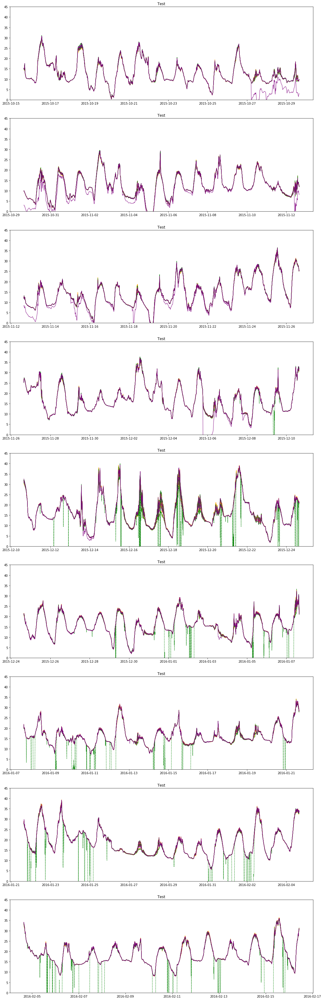

In [12]:
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SensorBodyTemp,45,0)

### There are problems with a few sensors which appears to be comming from problems with body temperature referece.  Need to identify this and drop the offending data

In [13]:
MedianBodyTemp = Data.IR_SensorBodyTemp.median(axis=1)
Deviation = pd.DataFrame(index = Data.IR_SensorBodyTemp.index,columns = Data.IR_SensorBodyTemp.columns)
for col in Deviation.columns:
    Deviation.loc[:,col] = Data.IR_SensorBodyTemp.loc[:,col] - MedianBodyTemp

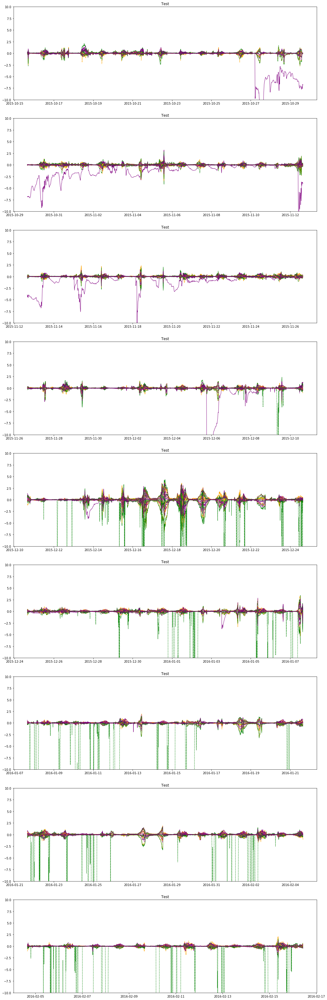

In [14]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Deviation,10,-10)

In [15]:
Data.IR_SurfaceTemp = Data.IR_SurfaceTemp.where(Deviation>-2.0,np.nan)

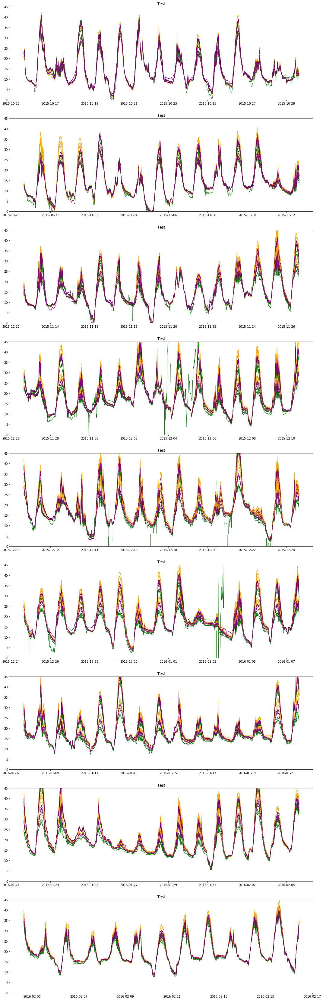

In [16]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

### There is still a problem with one sensor.  We will have to identify outliers relative to their treatment means.


In [17]:
Treatmedians = Data.IR_SurfaceTemp.groupby(level=['Irrigation','Nitrogen'],axis=1).median()
ST_Deviation = Deviation.copy()
for C in ST_Deviation.columns:
    ST_Deviation.loc[:,C] = Data.IR_SurfaceTemp.loc[:,C] - Treatmedians.loc[:,(C[0],C[1])]

In [18]:
C

('Irrigated', '50', 4, 'Deg C', 'Avg', 119, '4')

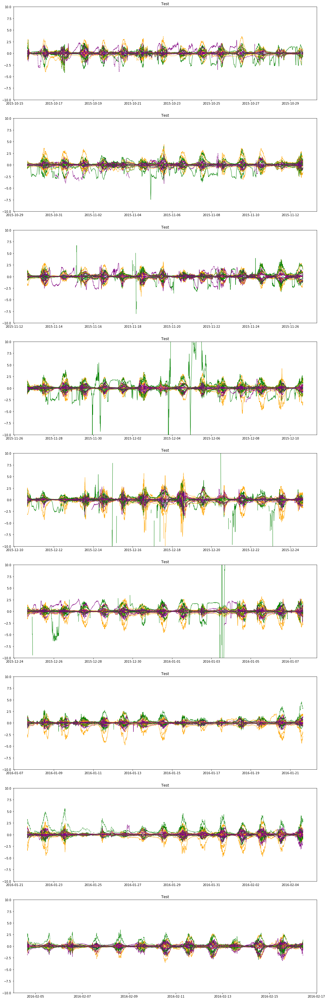

In [19]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(ST_Deviation,10,-10)


## Remove data anomolies relative to treatment means

In [20]:
Data.IR_SurfaceTemp = Data.IR_SurfaceTemp.where((ST_Deviation>-2) & (ST_Deviation<2),np.nan)

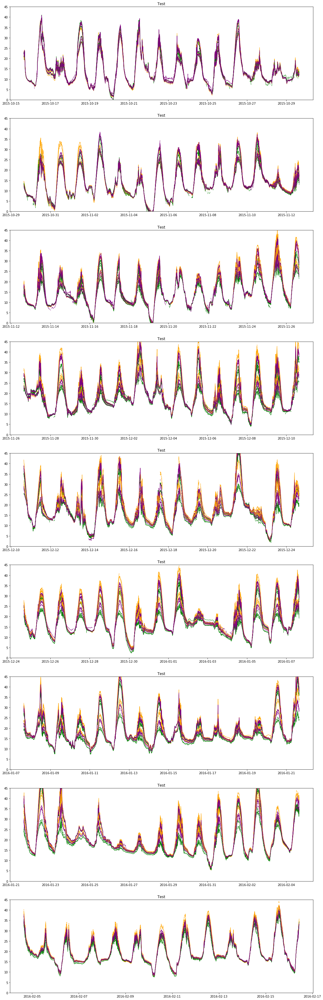

In [21]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

## Data looks OK to progress with now

# Now lets look at soil temp

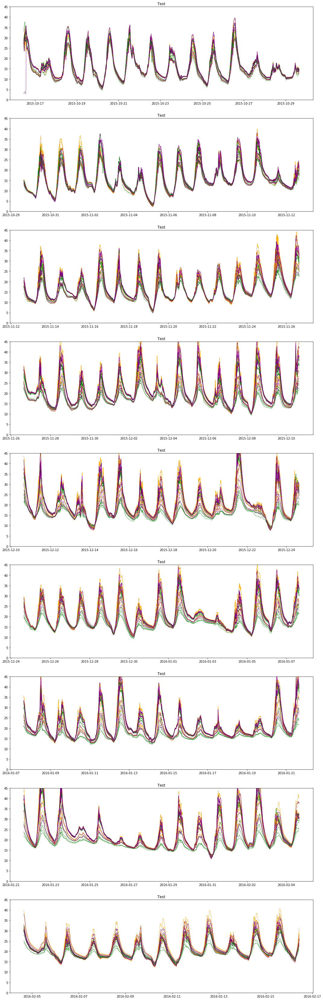

In [22]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.SurfaceSoilTemp,45,0)

## No obvious outlyers, assume needs no cleaning

## Check reflected radiation

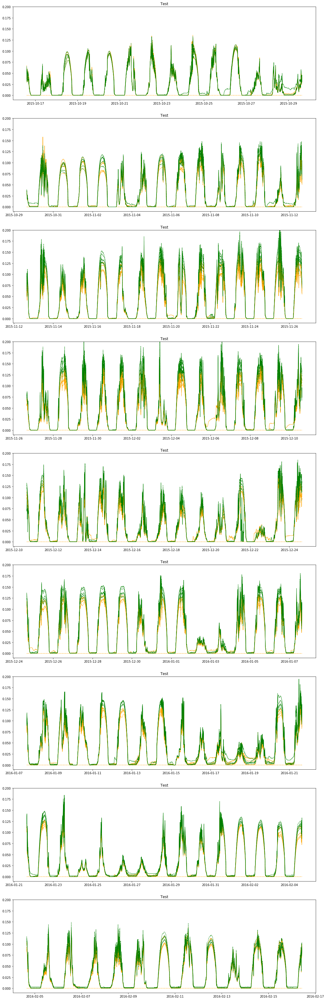

In [23]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.ReflectedRadnMJ,0.2,-0.01)

## One sensor is returning zeros, need to null these values 

In [24]:
Data.loc[:,('ReflectedRadnMJ','Irrigated','0',2,slice(None),slice(None),103)] = np.nan
Data.loc[:,('ReflectedRadnKW','Irrigated','0',2,slice(None),slice(None),103)] = np.nan

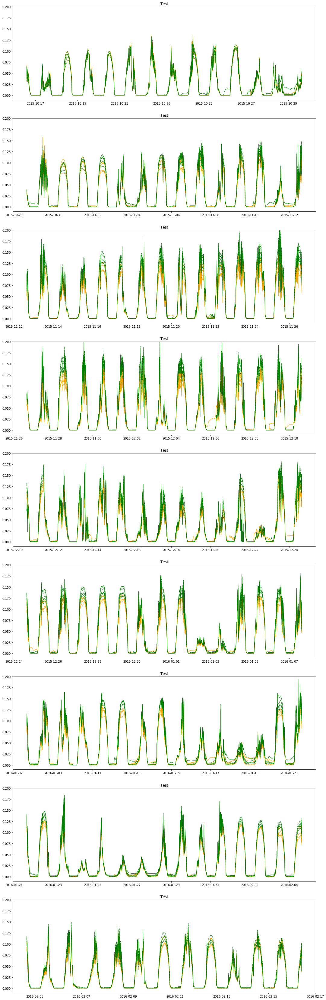

In [25]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.ReflectedRadnMJ,0.2,-0.01)

## Now lets look at above canopy par

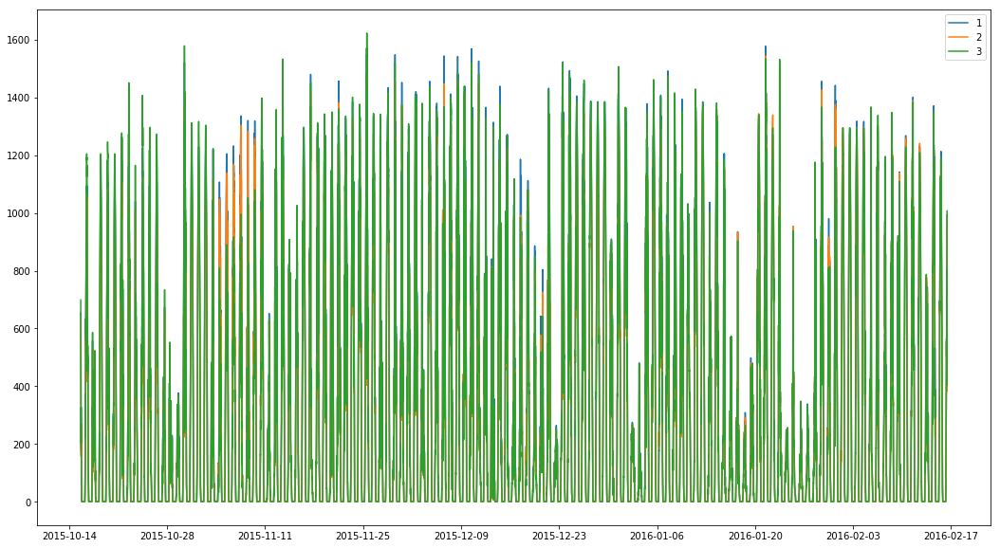

In [26]:
Figure = plt.figure(figsize=(18,10))
plt.plot(Data.AboveCanopyPAR1,label='1')
plt.plot(Data.AboveCanopyPAR2,label='2')
plt.plot(Data.AboveCanopyPAR3,label='3')
plt.legend()

## all three are behaving well so lets take the mean

In [27]:
Data.loc[:,('AboveCanopyPAR','Expt','Expt','Expt','mmolPAR','Ave','Expt','Expt')] = Data.loc[:,['AboveCanopyPAR1','AboveCanopyPAR2','AboveCanopyPAR3']].mean(axis=1)

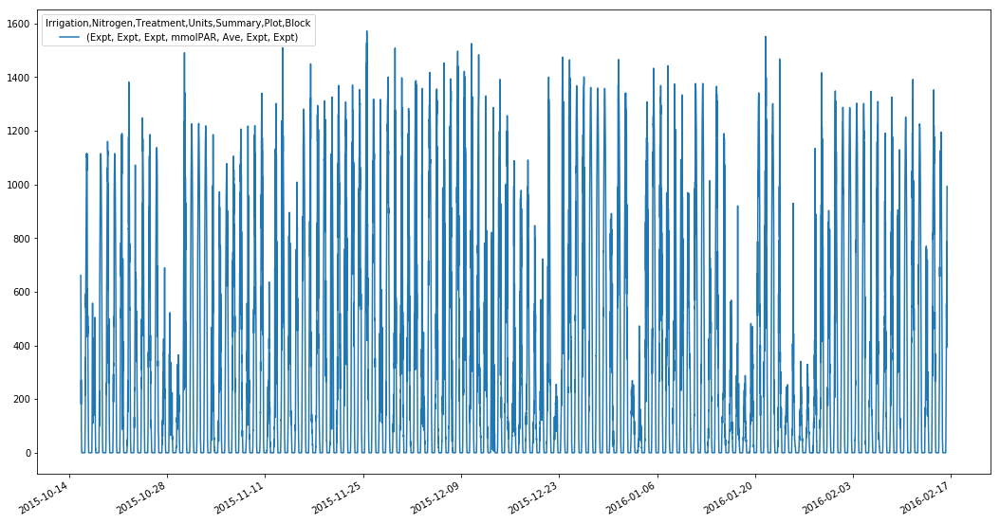

In [28]:
Data.AboveCanopyPAR.plot(figsize = (18,10))

In [29]:
Data.drop(columns = ['AboveCanopyPAR1','AboveCanopyPAR2','AboveCanopyPAR3'], level=0,inplace=True)

# Check Met Data.  Radiation first.

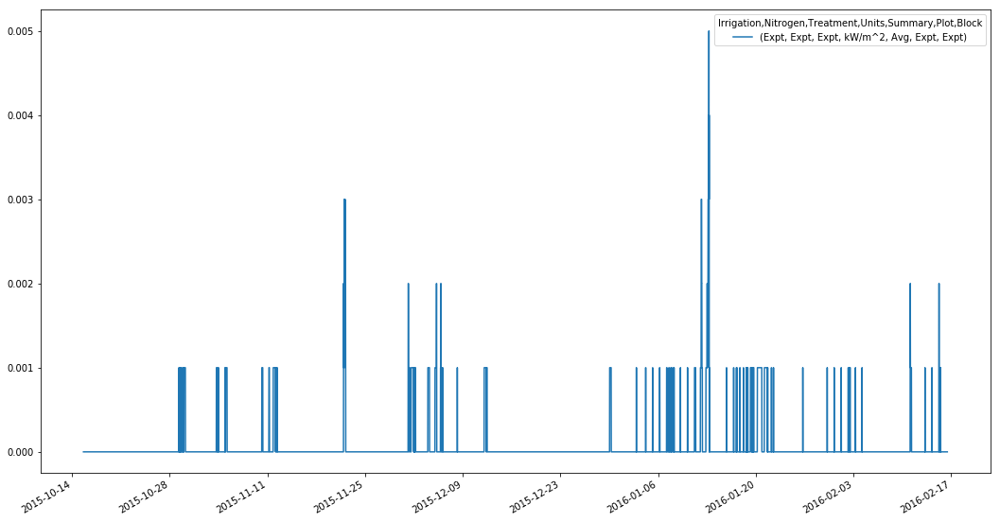

In [30]:
Data.IncomingRadnKW.plot(figsize = (18,10))

## Problem with Radiation sensor, Will Need to patch this with BroadFields data

In [31]:
BroadFieldsMet = pd.read_pickle('..\BroadFieldsMet.pkl')
Data.loc[:,'IncomingRadnMJ'] = BroadFieldsMet.reindex(index = Data.index)['IncomingRadnMJ']
Data.loc[:,'IncomingRadnKW'] = (Data.loc[:,'IncomingRadnMJ'] * 1e6 /600/1000).values 

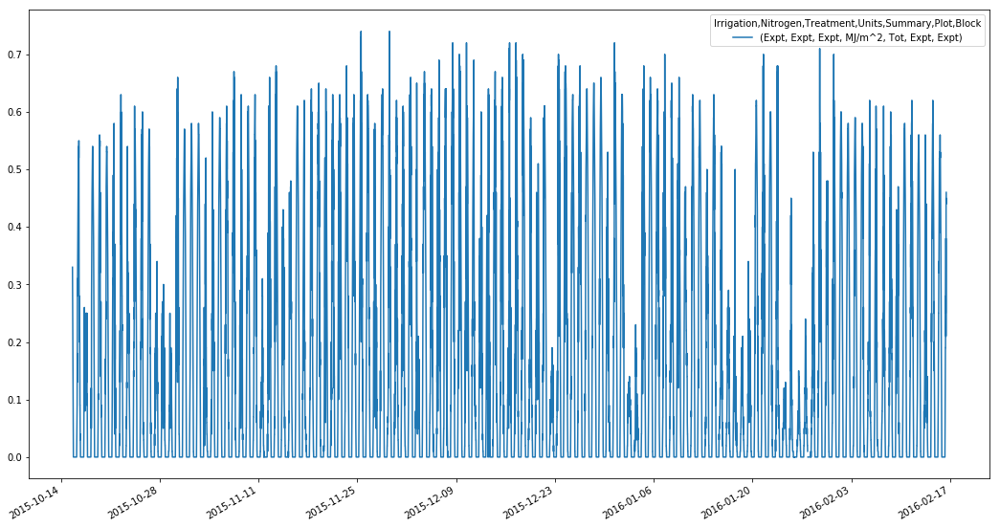

In [32]:
Data.IncomingRadnMJ.plot(figsize = (18,10))

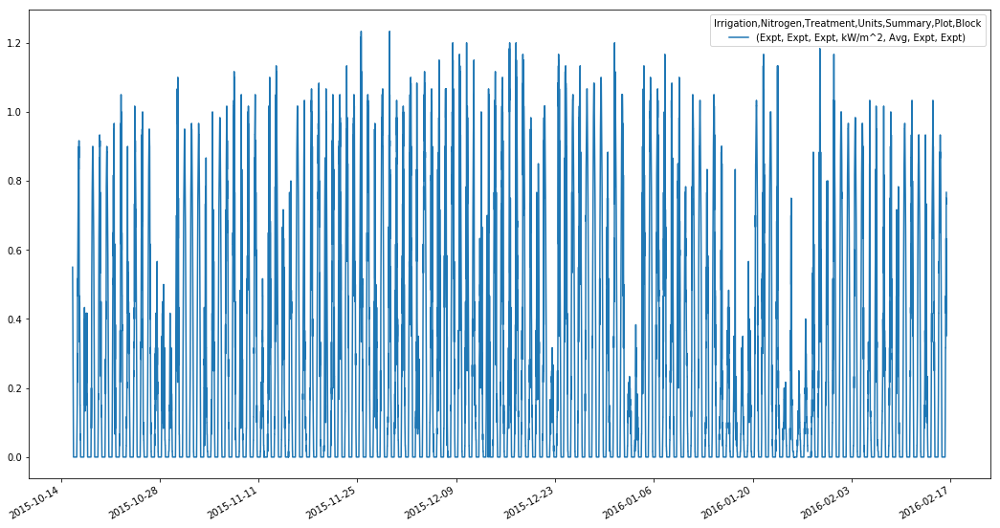

In [33]:
Data.IncomingRadnKW.plot(figsize = (18,10))

## Then Air Temperature

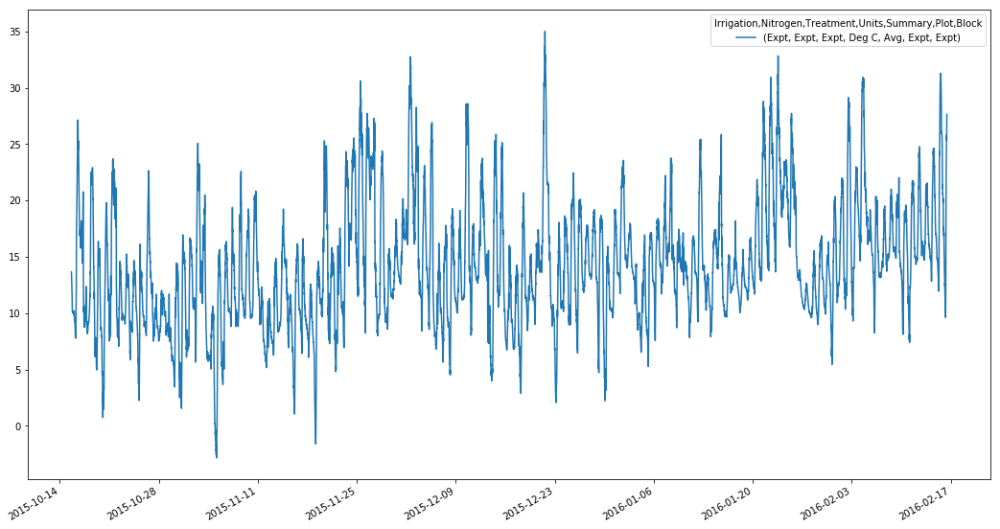

In [34]:
Data.AirTemperature.plot(figsize = (18,10))

## Check humidity

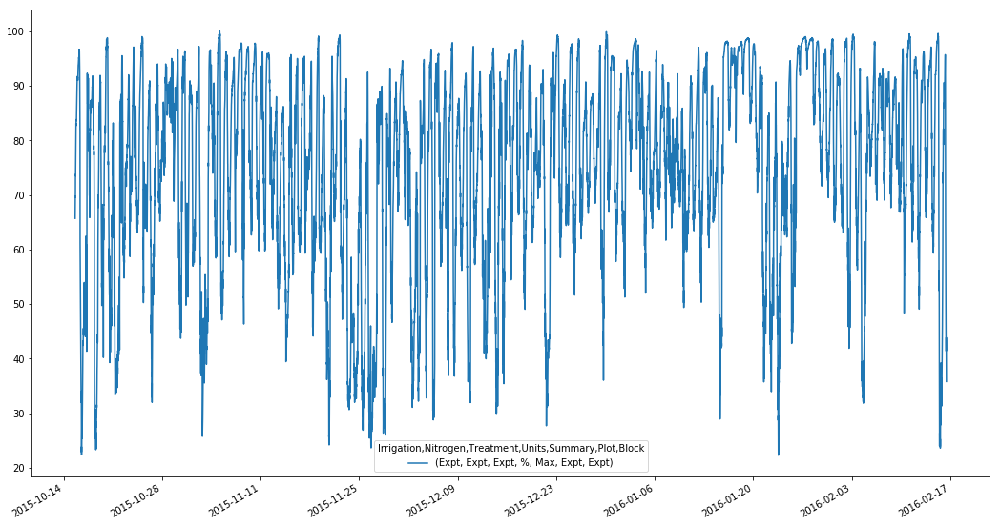

In [35]:
Data.RelativeHumidity.plot(figsize = (18,10))

## Check Wind

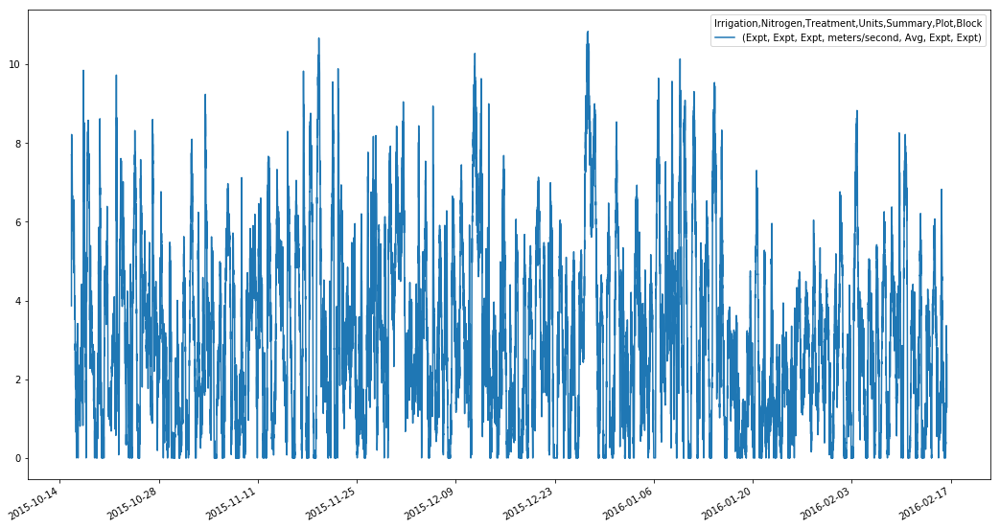

In [36]:
Data.Windspeed.plot(figsize = (18,10))

In [43]:
Data.index.min()

Timestamp('2015-10-15 15:40:00')

(0, 0.5)

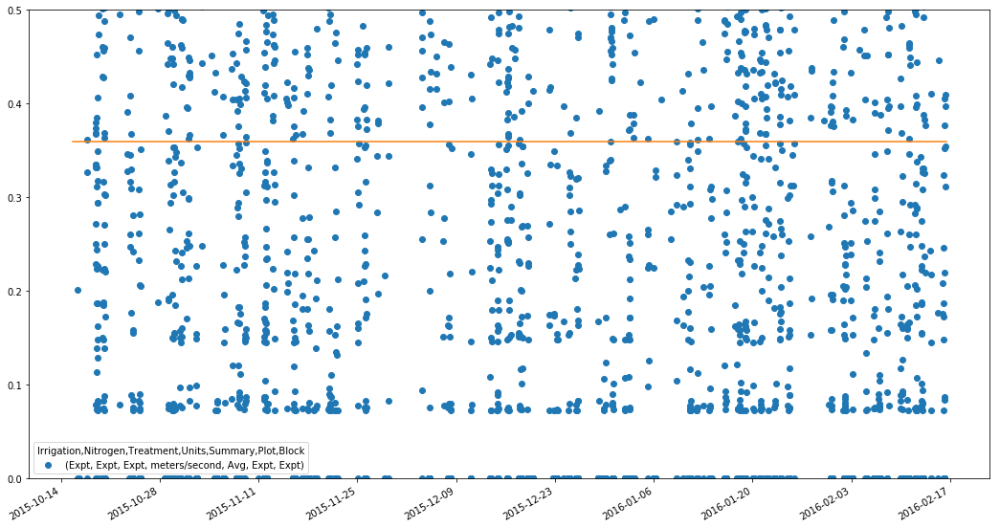

In [37]:
Data.Windspeed.plot(figsize=(18,10),style='o')
plt.plot([Data.index.min(),Data.index.max()],[0.36,0.36])
plt.ylim(0,0.5)

### For some reason data logger not zeroing windspeeds <0.36m/x so we need to enforce this

In [38]:
Data.Windspeed = Data.Windspeed.where(Data.Windspeed>0.36,0.0)

(0, 0.5)

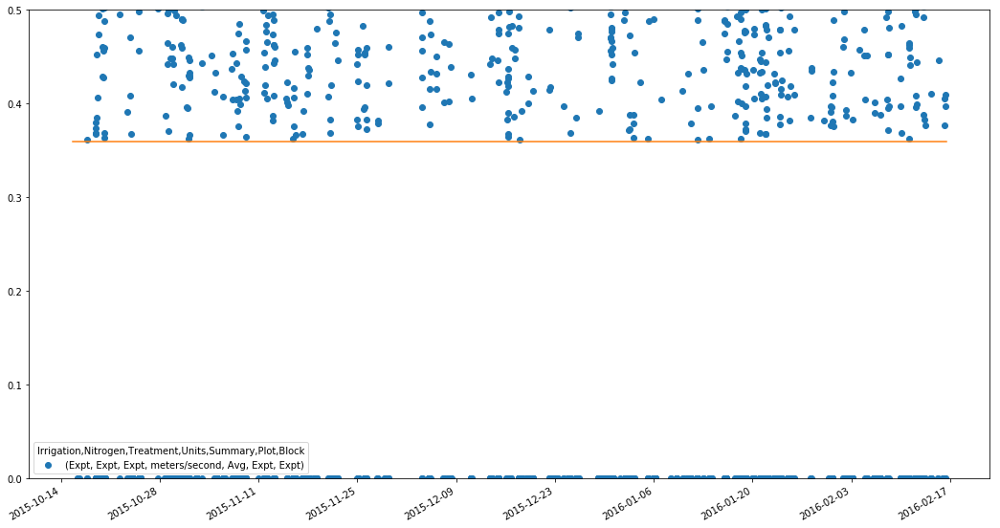

In [39]:
Data.Windspeed.plot(figsize=(18,10),style='o')
plt.plot([Data.index.min(),Data.index.max()],[0.36,0.36])
plt.ylim(0,0.5)

## Check Leaf Wettness

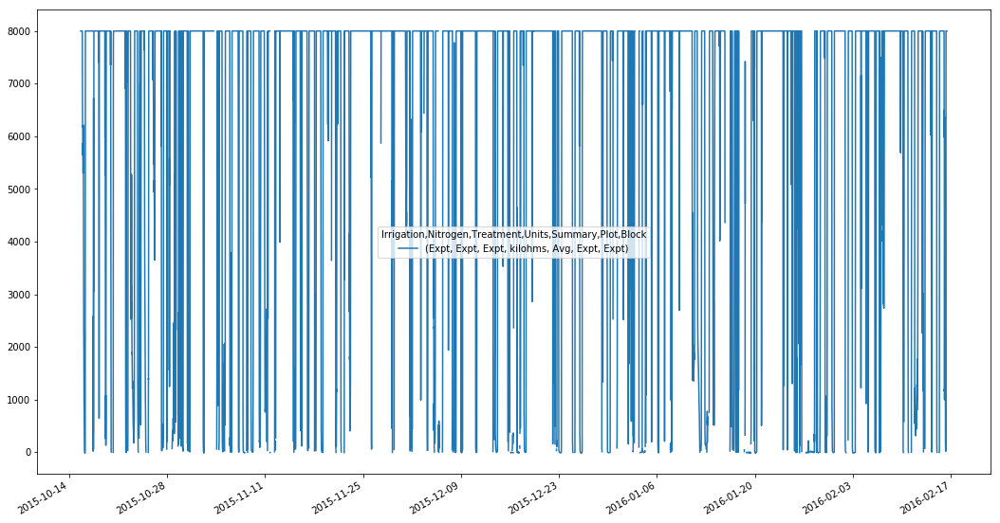

In [40]:
Data.Leafwetness.plot(figsize = (18,10))

# Now we have a clean data set lets pickle it

In [41]:
Data.to_pickle('.\DataFrames\TempAndRadnCleaned.pkl')

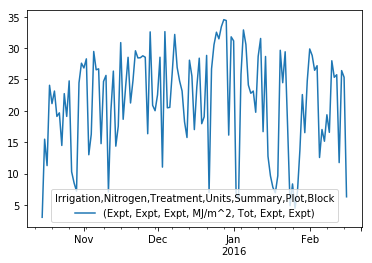

In [42]:
Data.IncomingRadnMJ.resample('d').sum().plot()